<h1><center><u>DeOldify</h1></center></u>

Hello and welcome to the assignment!!

![do2.png](https://i.pinimg.com/originals/8c/c5/70/8cc570b4a16d2a5ca411d2c4617195ac.png)

In this assignment you will be learning about DeOldify.

<h2><u>Table of Contents</h2></u>
1. What is DeOldify?<br>
2. Colorizing images<br>
3. Colorizing videos



<h2><u>What is DeOldify?</h2></u>
DeOldify is a cutting-edge tool for colourizing black-and-white photos and videos. DeOldify used GANs(Generative Adversarial Networks) to colourize both images to create colourized stable video. But now it uses a variant of GAN called NoGAN, developed for DeOldify.

![do1.png](https://i.ytimg.com/vi/1EP_Lq04h4M/maxresdefault.jpg)


Some of the DeOldify project's new features include:

* Glitch removal in video
* Skin tone that is more correct
* Blue colour has a lower bias.
* More highly detailed and hyper-realistic outputs using NoGAN, a novel effective

Before beginning the implementation, have a look at the video given below.

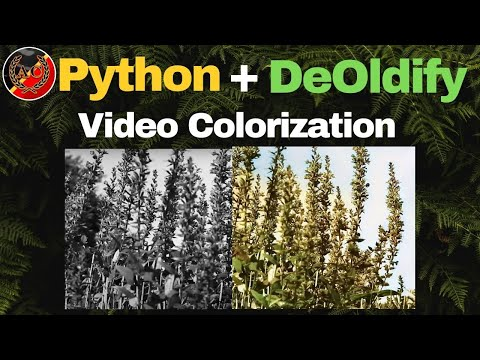

In [1]:
###Refer Video
from IPython.display import YouTubeVideo
YouTubeVideo('FxwlM-ir674', width=700, height=400)

<h2><u>Colorizing images</h2></u>

Lets look into the implementation step by step.

<h3><u>Verify Correct Runtime Settings</h3></u>
In the "Runtime" menu for the notebook window, select "Change runtime type." Ensure that the following are selected:

* Runtime Type = Python 3
* Hardware Accelerator = GPU

Now lets move on to the next step in which we will clone the github file of DeOldify so that we can use it in our system. Refer documentation: https://www.atlassian.com/git/tutorials/setting-up-a-repository/git-clone


<h3><u>Git clone and install DeOldify</h3></u>


In [2]:
# clone the github file 'https://github.com/jantic/DeOldify.git'
! git clone https://github.com/jantic/DeOldify.git DeOldify

fatal: destination path 'DeOldify' already exists and is not an empty directory.


Change the working directory to DeOldify using the cd command.

In [3]:
# Change the working directory to DeOldify

import os
os.chdir('/content/DeOldify')

<h3><u>Setup</h3></u>

In this step, setup the device GPU in order to make the colorizing process smooth. We will using GPU instead of CPU as we have to work with images and videos and GPU performs well in this case. Know what is a GPU:https://www.intel.com/content/www/us/en/products/docs/processors/what-is-a-gpu.html First import device from deoldify, then DeviceId from deoldify.device_id. Next set the device ID of the device to the device ID of the GPU.

In [4]:
! pip uninstall -y torch torchvision torchaudio
! pip install torch==2.5.1 torchvision==0.20.1 torchaudio==2.5.1

Found existing installation: torch 2.5.1
Uninstalling torch-2.5.1:
  Successfully uninstalled torch-2.5.1
Found existing installation: torchvision 0.20.1
Uninstalling torchvision-0.20.1:
  Successfully uninstalled torchvision-0.20.1
Found existing installation: torchaudio 2.5.1
Uninstalling torchaudio-2.5.1:
  Successfully uninstalled torchaudio-2.5.1
  Using cached torch-2.5.1-cp312-cp312-manylinux1_x86_64.whl.metadata (28 kB)
  Using cached torchvision-0.20.1-cp312-cp312-manylinux1_x86_64.whl.metadata (6.1 kB)
  Using cached torchaudio-2.5.1-cp312-cp312-manylinux1_x86_64.whl.metadata (6.4 kB)
Using cached torch-2.5.1-cp312-cp312-manylinux1_x86_64.whl (906.4 MB)
Using cached torchvision-0.20.1-cp312-cp312-manylinux1_x86_64.whl (7.2 MB)
Using cached torchaudio-2.5.1-cp312-cp312-manylinux1_x86_64.whl (3.4 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch

In [ ]:
# import the mentioned libraries
from deoldify import device
from deoldify.device_id import DeviceId
#set the device ID
device.set(device=DeviceId.GPU0)


Now import torch, which is a Python package that provides two high-level features: Tensor computation (like NumPy) with strong GPU acceleration and Deep neural networks built on a tape-based autograd system. https://pypi.org/project/torch/. Next. check if GPU is available or not using the torch.cuda.is_available function.

In [6]:
# import torch
import torch
if not torch.cuda.is_available():
  print('gpu is not availbale')
else:
  print('gpu is available')

# check for GPU


gpu is not availbale


Next install all the mentioned requirements in the requirements.txt
These are the required libraries.
* fastai==1.0.51 : a deep learning library, https://github.com/fastai/fastai
* tensorboardX==1.6 : A module for visualization with tensorboard, https://tensorboardx.readthedocs.io/en/latest/tensorboard.html
* ffmpeg-python : cross-platform solution to record, convert and stream audio and video, https://github.com/kkroening/ffmpeg-python
* youtube-dl>=2019.4.17: download manager for video and audio from YouTube, https://github.com/ytdl-org/youtube-dl
* opencv-python>=3.3.0.10 : for computer vision and image processing tasks, https://pypi.org/project/opencv-python/
* pillow==8.3.2 : support for opening, manipulating, and saving many different image file formats, https://pillow.readthedocs.io/
* tornado~=5.1.0: a web application framework, https://www.tornadoweb.org/




In [7]:
#install required libraries
! pip install -r /content/DeOldify/requirements.txt

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu113


Import fastai, everything from deoldify.visualize and warnings. Filter the warnings using filterwarnings function. Refer for warnings: https://docs.python.org/3/library/warnings.html

In [8]:
# import the mentioned libraries

import fastai
from  deoldify.visualize import *
import warnings
# filter the warnings
warnings.filterwarnings('ignore')

INFO:numexpr.utils:NumExpr defaulting to 2 threads.


NumExpr defaulting to 2 threads.


Now Download pretrained DeOldify models. Make a directory named 'models' using the mkdir command. And download the artistic deoldify model using the wget command. Here is the link of the model. https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth

In [9]:
# create the models directory
! mkdir 'models'
! wget  https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth -O ./models/ColorizeArtistic_gen.pth
# download the pretrained artistic model


mkdir: cannot create directory ‘models’: File exists
--2026-05-12 05:39:31--  https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth
Resolving data.deepai.org (data.deepai.org)... 143.244.56.53, 2400:52e0:1e02::946:1
Connecting to data.deepai.org (data.deepai.org)|143.244.56.53|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 255144681 (243M) [application/octet-stream]
Saving to: ‘./models/ColorizeArtistic_gen.pth’

./models/ColorizeAr 100%[===================>] 243.32M  4.94MB/s    in 49s     

2026-05-12 05:40:20 (4.92 MB/s) - ‘./models/ColorizeArtistic_gen.pth’ saved [255144681/255144681]



Download the watermark image. This watermark will be placed on the colorized images and videos. https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png

In [10]:
# Download the watermark image
! wget https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png -O ./resource_images/watermark.png



--2026-05-12 05:40:20--  https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2026-05-12 05:40:21 ERROR 404: Not Found.



Now create the image colorizer object using the get_image_colorizer method. Keep the artistic attribute as True as we are using the artistic model of colorizer.

In [11]:
# create object
# import torch
# import functools

# from fastai.basic_train import Recorder
# from fastai.basic_data import DatasetType
# from fastai.core import Defaults
# from fastai.vision.image import Image

# torch.serialization.add_safe_globals([
#     functools.partial,
#     Recorder,
#     DatasetType,
#     Defaults,
#     Image
# ])
colorizer=get_image_colorizer(artistic=True)

Next we will colorize the image by passing url of the image. Below mentioned are some of the parameters required for colorization.
* source_url:

Enter the URL for an image's direct connection. That usually implies they'll finish in.png,.jpg, or something like.
* render_factor:

This defines the resolution at which the image's colour section is presented. The default value of 35 was set with consideration and should enough in most cases.
* watermarked:

This option is selected by default, and it adds a watermark icon of a palette to the image's bottom left corner.

Colorize the image using the plot_transformed_image_from_url method passing the above mentioned attributes.

In [12]:
!pip uninstall -y pillow
!pip install pillow==8.3.2

Found existing installation: Pillow 9.3.0
Uninstalling Pillow-9.3.0:
  Successfully uninstalled Pillow-9.3.0
  Using cached Pillow-8.3.2-cp312-cp312-linux_x86_64.whl
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchvision 0.20.1 requires pillow!=8.3.*,>=5.3.0, but you have pillow 8.3.2 which is incompatible.
scikit-image 0.25.2 requires pillow>=10.1, but you have pillow 8.3.2 which is incompatible.
torchtune 0.6.1 requires Pillow>=9.4.0, but you have pillow 8.3.2 which is incompatible.


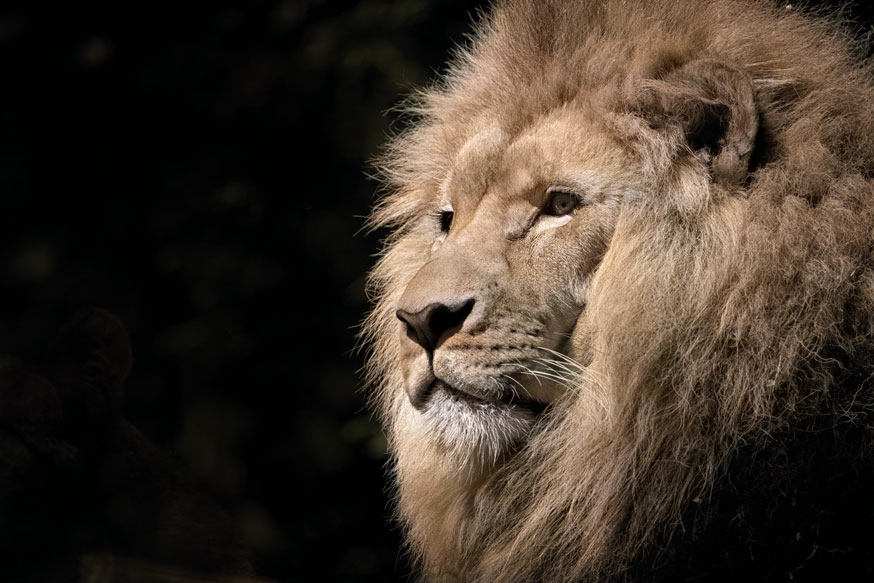

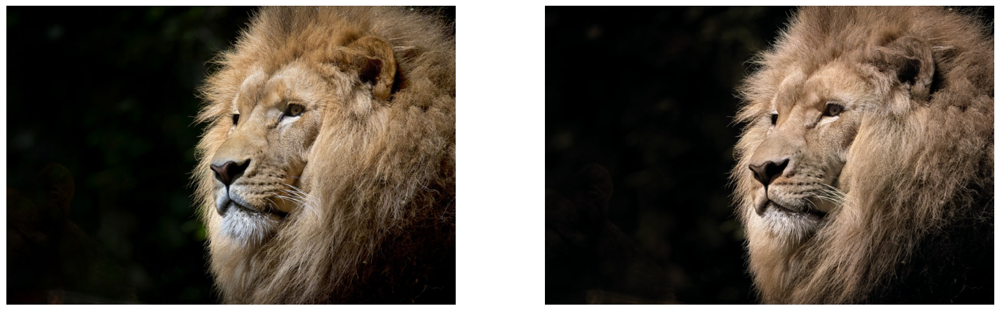

In [13]:
# set the source url
source = 'https://www.marariversafarilodge.com/wp-content/uploads/2019/08/lion.jpg'

# set render factor
render_factor = 35

# set watermark
watermarked = True

# check source url exists
if source is not None and source != '':

    # colorize image
    imagepath = colorizer.plot_transformed_image_from_url(
        url=source,
        render_factor=render_factor,
        compare=True,
        watermarked=watermarked
    )

    # show image
    show_image_in_notebook(imagepath)

else:
    print('Provide an image URL and try again')

You can also colorize an image from your device. In place of source url, add the location of the image.

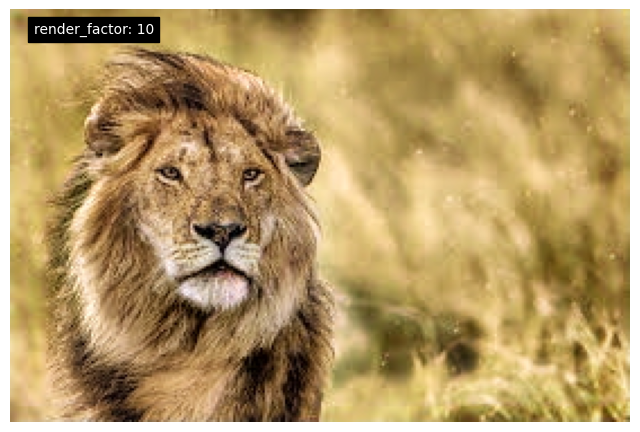

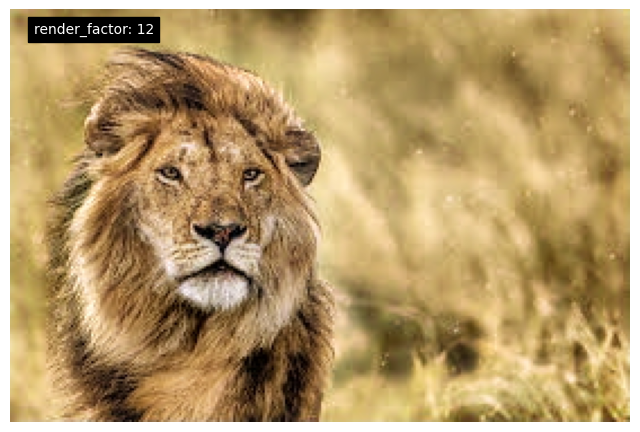

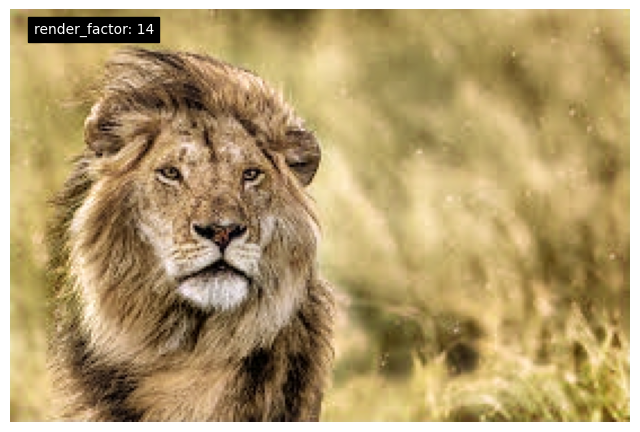

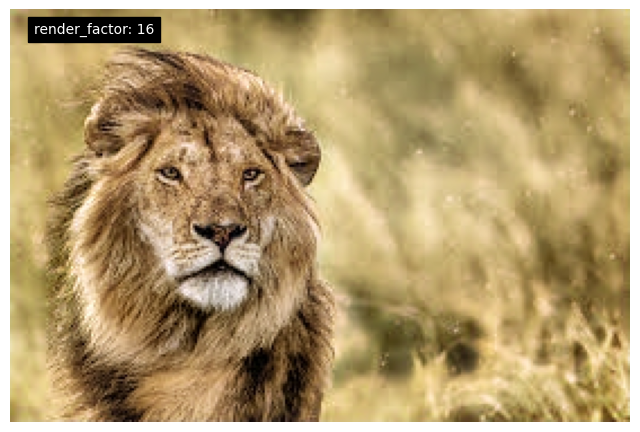

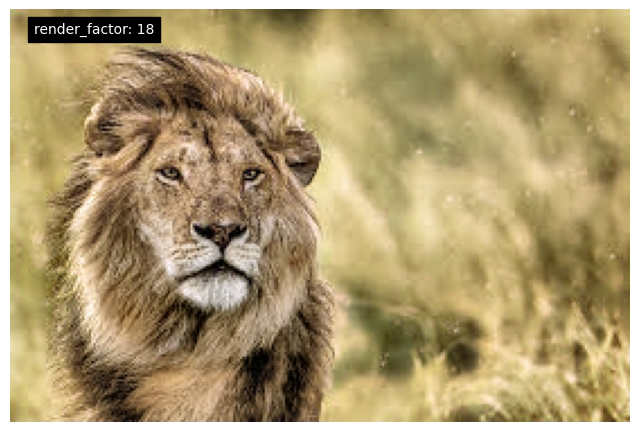

...

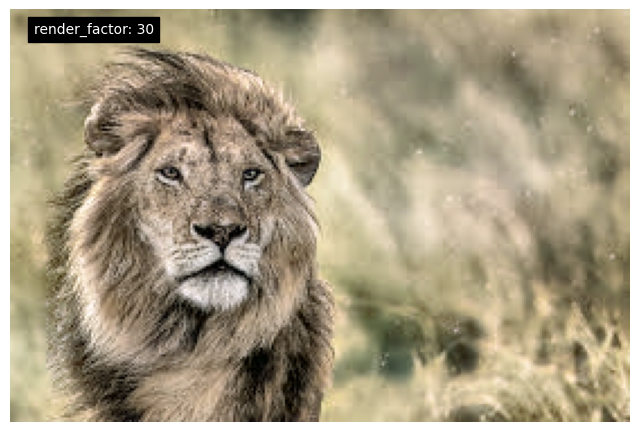

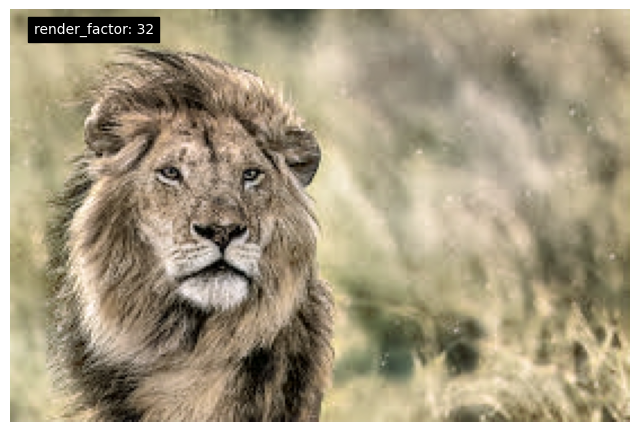

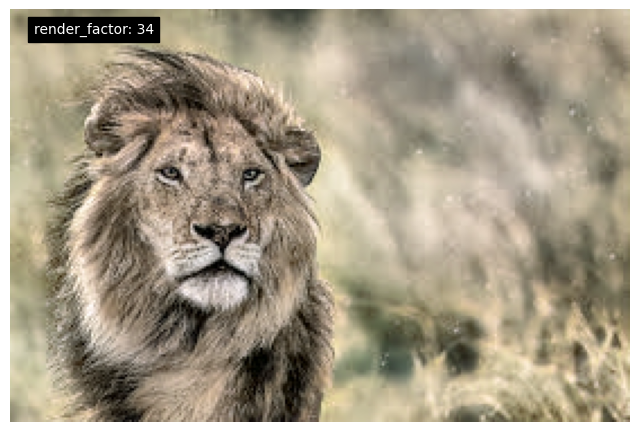

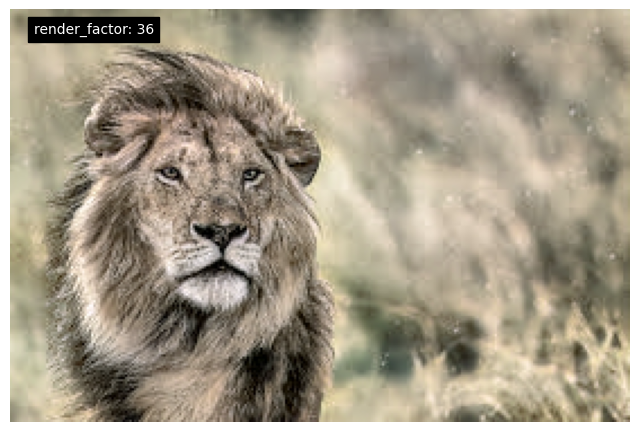

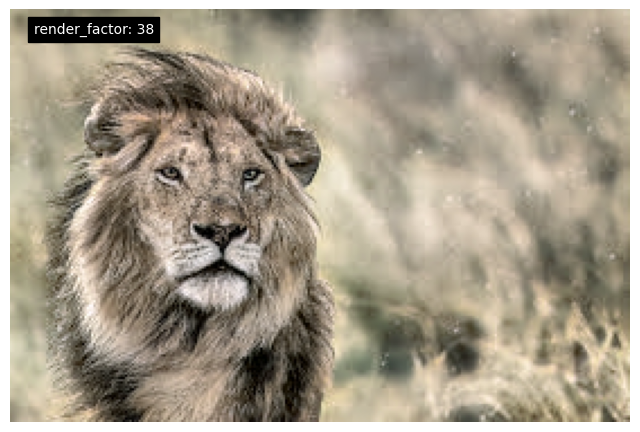

In [14]:
# colorize the image and display it
for i in range(10,40,2):
  colorizer.plot_transformed_image('/content/DeOldify/test_images/lion.jpg',render_factor=i,display_render_factor=True,figsize=(8,8))

<h2><u>Colorizing videos</h2></u>

Now lets colorize some videos.
<br>In the first step, Download Video Colorizing model of Deoldify using the wget command. https://data.deepai.org/deoldify/ColorizeVideo_gen.pth


In [15]:
# download video colorizing model
! wget https://data.deepai.org/deoldify/ColorizeVideo_gen.pth -O ./models/ColorizeVideo_gen.pth

--2026-05-12 05:47:02--  https://data.deepai.org/deoldify/ColorizeVideo_gen.pth
Resolving data.deepai.org (data.deepai.org)... 185.93.2.246, 2400:52e0:1e02::1216:1
Connecting to data.deepai.org (data.deepai.org)|185.93.2.246|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 874066230 (834M) [application/octet-stream]
Saving to: ‘./models/ColorizeVideo_gen.pth’

./models/ColorizeVi 100%[===================>] 833.57M  4.91MB/s    in 2m 51s  

2026-05-12 05:49:52 (4.89 MB/s) - ‘./models/ColorizeVideo_gen.pth’ saved [874066230/874066230]



In [16]:
# from google.colab import drive
# drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

After downloading the model, Initialize video object using the get_video_colorizer method.


In [17]:
# initialize video object
v_colorizer=get_video_colorizer()

Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:01<00:00, 109MB/s] 


Now set the parameters as done for colorizing images. For source url, provide the youtube link of a black and white video or video location from your device. Set the render factor and watermark value as well. Colorize the video using the colorize_from_url method.

In [18]:
# set source url
sourceurl='/content/DeOldify/test_images/19182469-uhd_2160_3840_30fps.mp4'
# set render factor
render_factor=21
# set watermarked
watermarked=True

# get the colorized video path
path=v_colorizer.colorize_from_file_name(sourceurl,render_factor,watermarked)
# show the colorized video
show_video_in_notebook(path)

<div><progress max="903" value="32"></progress> 3.54% [32/903 06:34&lt;2:59:01]</div>

KeyboardInterrupt: 

Hurrayyy!! That looks like magic!!<br>

In this assignment you've learnt colorizing black and white images and videos using DeOldify. DeOldify is a library for colorizing black and white images and videos.Try it out for your old photographs and bring back the old colors.

## Do fill the feedback form given below:
[Feedback form](https://forms.zohopublic.in/cloudyml/form/CloudyMLDeepLearningFeedbackForm/formperma/VCFbldnXAnbcgAIl0lWv2blgHdSldheO4RfktMdgK7)

See you in the next assignment.

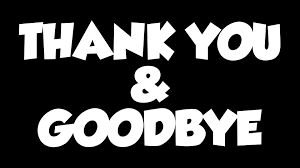